
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
# File location and type
file_location = "/FileStore/tables/Global_Health_Statistics.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "false"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

_c0,_c1,_c2,_c3,_c4,_c5,_c6,_c7,_c8,_c9,_c10,_c11,_c12,_c13,_c14,_c15,_c16,_c17,_c18,_c19,_c20,_c21
Country,Year,Disease Name,Disease Category,Prevalence Rate (%),Incidence Rate (%),Mortality Rate (%),Age Group,Gender,Population Affected,Healthcare Access (%),Doctors per 1000,Hospital Beds per 1000,Treatment Type,Average Treatment Cost (USD),Availability of Vaccines/Treatment,Recovery Rate (%),DALYs,Improvement in 5 Years (%),Per Capita Income (USD),Education Index,Urbanization Rate (%)
Italy,2013,Malaria,Respiratory,0.95,1.55,8.42,0-18,Male,471007,57.74,3.34,7.58,Medication,21064,No,91.82,4493,2.16,16886,0.79,86.02
France,2002,Ebola,Parasitic,12.46,8.63,8.75,61+,Male,634318,89.21,1.33,5.11,Surgery,47851,Yes,76.65,2366,4.82,80639,0.74,45.52
Turkey,2015,COVID-19,Genetic,0.91,2.35,6.22,36-60,Male,154878,56.41,4.07,3.49,Vaccination,27834,Yes,98.55,41,5.81,12245,0.41,40.2
Indonesia,2011,Parkinson's Disease,Autoimmune,4.68,6.29,3.99,0-18,Other,446224,85.2,3.18,8.44,Surgery,144,Yes,67.35,3201,2.22,49336,0.49,58.47
Italy,2013,Tuberculosis,Genetic,0.83,13.59,7.01,61+,Male,472908,67.0,4.61,5.9,Medication,8908,Yes,50.06,2832,6.93,47701,0.5,48.14
Saudi Arabia,2011,Dengue,Bacterial,10.99,6.49,4.64,61+,Female,479234,98.41,3.5,0.62,Therapy,42671,Yes,93.17,416,9.83,29597,0.46,56.5
USA,2013,Malaria,Cardiovascular,18.42,6.33,9.33,61+,Female,289931,90.03,3.16,3.31,Surgery,15579,No,92.8,4535,0.89,60027,0.7,20.48
Nigeria,2007,Tuberculosis,Neurological,3.48,5.71,1.21,0-18,Female,393296,75.6,0.54,3.54,Medication,15744,Yes,65.45,4584,9.81,23222,0.46,66.49
Italy,2000,Rabies,Chronic,15.59,4.74,6.38,19-35,Female,253110,87.87,4.56,5.84,Therapy,7669,Yes,59.23,2253,9.92,30849,0.55,41.27


In [0]:
import pandas as pd
import numpy as np
from pyspark.sql import SparkSession
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression



In [0]:
# File location and type
file_location = "/FileStore/tables/Global_Health_Statistics.csv"
file_type = "csv"

# CSV options
infer_schema = "true"  # Change to "true" if you want to infer schema automatically
first_row_is_header = "true"  # Set this to true if the first row contains column names
delimiter = ","  # Specify the delimiter

# Load the data into a Spark DataFrame
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

# Display the Spark DataFrame
display(df)

# Convert Spark DataFrame to Pandas DataFrame
pandas_df = df.toPandas()

# Display the first few rows of the Pandas DataFrame
print(pandas_df.head())


Country,Year,Disease Name,Disease Category,Prevalence Rate (%),Incidence Rate (%),Mortality Rate (%),Age Group,Gender,Population Affected,Healthcare Access (%),Doctors per 1000,Hospital Beds per 1000,Treatment Type,Average Treatment Cost (USD),Availability of Vaccines/Treatment,Recovery Rate (%),DALYs,Improvement in 5 Years (%),Per Capita Income (USD),Education Index,Urbanization Rate (%)
Italy,2013,Malaria,Respiratory,0.95,1.55,8.42,0-18,Male,471007,57.74,3.34,7.58,Medication,21064,No,91.82,4493,2.16,16886,0.79,86.02
France,2002,Ebola,Parasitic,12.46,8.63,8.75,61+,Male,634318,89.21,1.33,5.11,Surgery,47851,Yes,76.65,2366,4.82,80639,0.74,45.52
Turkey,2015,COVID-19,Genetic,0.91,2.35,6.22,36-60,Male,154878,56.41,4.07,3.49,Vaccination,27834,Yes,98.55,41,5.81,12245,0.41,40.2
Indonesia,2011,Parkinson's Disease,Autoimmune,4.68,6.29,3.99,0-18,Other,446224,85.2,3.18,8.44,Surgery,144,Yes,67.35,3201,2.22,49336,0.49,58.47
Italy,2013,Tuberculosis,Genetic,0.83,13.59,7.01,61+,Male,472908,67.0,4.61,5.9,Medication,8908,Yes,50.06,2832,6.93,47701,0.5,48.14
Saudi Arabia,2011,Dengue,Bacterial,10.99,6.49,4.64,61+,Female,479234,98.41,3.5,0.62,Therapy,42671,Yes,93.17,416,9.83,29597,0.46,56.5
USA,2013,Malaria,Cardiovascular,18.42,6.33,9.33,61+,Female,289931,90.03,3.16,3.31,Surgery,15579,No,92.8,4535,0.89,60027,0.7,20.48
Nigeria,2007,Tuberculosis,Neurological,3.48,5.71,1.21,0-18,Female,393296,75.6,0.54,3.54,Medication,15744,Yes,65.45,4584,9.81,23222,0.46,66.49
Italy,2000,Rabies,Chronic,15.59,4.74,6.38,19-35,Female,253110,87.87,4.56,5.84,Therapy,7669,Yes,59.23,2253,9.92,30849,0.55,41.27
Australia,2006,Cholera,Chronic,10.12,2.08,6.0,61+,Male,174143,95.9,4.63,6.01,Medication,9468,Yes,93.21,4694,2.96,68856,0.9,83.3


     Country  Year         Disease Name Disease Category  Prevalence Rate (%)  \
0      Italy  2013              Malaria      Respiratory                 0.95   
1     France  2002                Ebola        Parasitic                12.46   
2     Turkey  2015             COVID-19          Genetic                 0.91   
3  Indonesia  2011  Parkinson's Disease       Autoimmune                 4.68   
4      Italy  2013         Tuberculosis          Genetic                 0.83   

   Incidence Rate (%)  Mortality Rate (%) Age Group Gender  \
0                1.55                8.42      0-18   Male   
1                8.63                8.75       61+   Male   
2                2.35                6.22     36-60   Male   
3                6.29                3.99      0-18  Other   
4               13.59                7.01       61+   Male   

   Population Affected  ...  Hospital Beds per 1000  Treatment Type  \
0               471007  ...                    7.58      Medication  

In [0]:
#Data Exploration and Cleaning
# Display basic information
print(pandas_df.info())  # Data types and non-null counts
print(pandas_df.describe())  # Summary statistics for numeric columns

# Check for missing values
print(pandas_df.isnull().sum())

# Check unique values for categorical columns
for column in pandas_df.select_dtypes(include='object').columns:
    print(f"{column} unique values: {pandas_df[column].unique()}")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 22 columns):
 #   Column                              Non-Null Count    Dtype  
---  ------                              --------------    -----  
 0   Country                             1000000 non-null  object 
 1   Year                                1000000 non-null  int32  
 2   Disease Name                        1000000 non-null  object 
 3   Disease Category                    1000000 non-null  object 
 4   Prevalence Rate (%)                 1000000 non-null  float64
 5   Incidence Rate (%)                  1000000 non-null  float64
 6   Mortality Rate (%)                  1000000 non-null  float64
 7   Age Group                           1000000 non-null  object 
 8   Gender                              1000000 non-null  object 
 9   Population Affected                 1000000 non-null  int32  
 10  Healthcare Access (%)               1000000 non-null  float64
 11  Doctors per 

In [0]:
pandas_df = pandas_df.dropna()  # Drop all rows with missing values


In [0]:
# Drop duplicate rows
pandas_df = pandas_df.drop_duplicates()


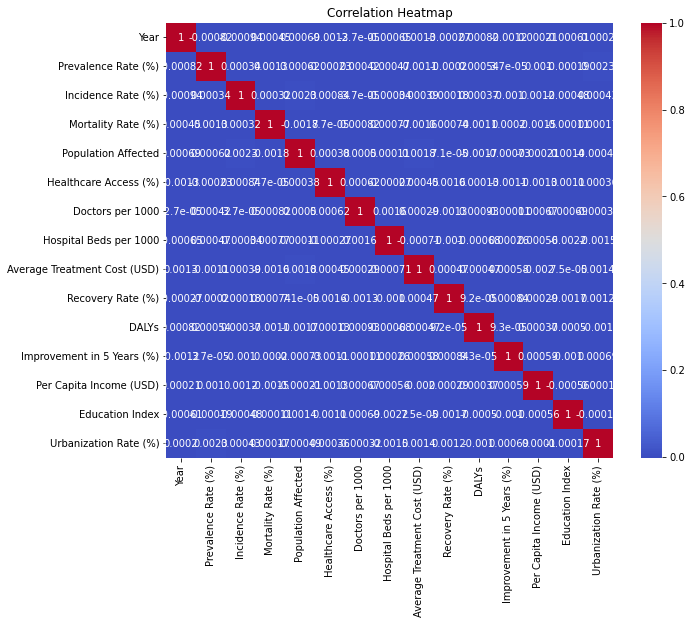

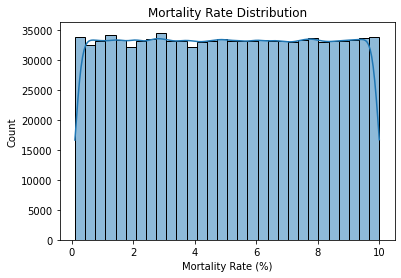

In [0]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pandas_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# Distribution of key features
sns.histplot(pandas_df['Mortality Rate (%)'], bins=30, kde=True)
plt.title('Mortality Rate Distribution')
plt.show()

In [0]:
# Drop the 'Country' column if not needed for prediction
# pandas_df = pandas_df.drop(columns=['Country'])

# One-hot encode the 'Country' column (for machine learning models)
pandas_df = pd.get_dummies(pandas_df, columns=['Country'], drop_first=True)

# Now check the data types again
print(pandas_df.dtypes)

# Now you can proceed with the rest of your pipeline, such as splitting the data, training the model, etc.


Year                                    int32
Disease Name                           object
Disease Category                       object
Prevalence Rate (%)                   float64
Incidence Rate (%)                    float64
Mortality Rate (%)                    float64
Age Group                              object
Gender                                 object
Population Affected                     int32
Healthcare Access (%)                 float64
Doctors per 1000                      float64
Hospital Beds per 1000                float64
Treatment Type                         object
Average Treatment Cost (USD)            int32
Availability of Vaccines/Treatment     object
Recovery Rate (%)                     float64
DALYs                                   int32
Improvement in 5 Years (%)            float64
Per Capita Income (USD)                 int32
Education Index                       float64
Urbanization Rate (%)                 float64
Country_Australia                 

In [0]:
# Get the list of columns with numeric data types (int, float, double)
numeric_columns = [col[0] for col in df.dtypes if col[1] in ['int', 'double', 'float']]

# Select only numeric columns to create a new DataFrame
numeric_spark_df = df.select(*numeric_columns)

# Show the new DataFrame with numeric columns
numeric_spark_df.show()


+----+-------------------+------------------+------------------+-------------------+---------------------+----------------+----------------------+----------------------------+-----------------+-----+--------------------------+-----------------------+---------------+---------------------+
|Year|Prevalence Rate (%)|Incidence Rate (%)|Mortality Rate (%)|Population Affected|Healthcare Access (%)|Doctors per 1000|Hospital Beds per 1000|Average Treatment Cost (USD)|Recovery Rate (%)|DALYs|Improvement in 5 Years (%)|Per Capita Income (USD)|Education Index|Urbanization Rate (%)|
+----+-------------------+------------------+------------------+-------------------+---------------------+----------------+----------------------+----------------------------+-----------------+-----+--------------------------+-----------------------+---------------+---------------------+
|2013|               0.95|              1.55|              8.42|             471007|                57.74|            3.34|          

In [0]:
numeric_spark_df
newpandas_df = numeric_spark_df.toPandas()


In [0]:
scaler = StandardScaler()
numeric_columns = ['Prevalence Rate (%)', 'Incidence Rate (%)', 'Healthcare Access (%)']
pandas_df[numeric_columns] = scaler.fit_transform(newpandas_df[numeric_columns])


In [0]:



# Assuming your DataFrame is named 'newpandas_df'

# 1. Select feature columns and the target column
# Replace with the actual numeric columns you want to use for training
feature_columns = ['Prevalence Rate (%)', 'Incidence Rate (%)', 'Healthcare Access (%)', 'Doctors per 1000',
                   'Hospital Beds per 1000', 'Recovery Rate (%)', 'Improvement in 5 Years (%)', 
                   'Per Capita Income (USD)', 'Education Index', 'Urbanization Rate (%)']  # Adjust as needed

target_column = 'Prevalence Rate (%)'  # Replace with your target column

# 2. Prepare the feature matrix (X) and target vector (y)
X = newpandas_df[feature_columns]  # Feature columns
y = newpandas_df[target_column]    # Target column

# 3. Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 4. Initialize and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# 5. Make predictions on the test data
y_pred = model.predict(X_test)

# 6. Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation results
print(f"Mean Squared Error (MSE): {mse}")
print(f"R2 Score: {r2}")

# 7. Optional: Show the first few predictions vs actual values
results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print(results.head())


Mean Squared Error (MSE): 3.696426461285918e-23
R2 Score: 1.0
        Actual  Predicted
987231   10.07      10.07
79954     5.68       5.68
567130   17.29      17.29
500891    5.03       5.03
55399    14.11      14.11


In [0]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
print("Cross-Validation MSE:", -scores.mean())


Cross-Validation MSE: 2.4189722156642988e-22


In [0]:
# Train-test split and evaluate performance
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Assuming X and y are your features and target variables
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on both training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Evaluate the performance on both training and testing data
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Training MSE: {train_mse}")
print(f"Test MSE: {test_mse}")
print(f"Training R²: {train_r2}")
print(f"Test R²: {test_r2}")


Training MSE: 3.6887241082738254e-23
Test MSE: 3.696426461285918e-23
Training R²: 1.0
Test R²: 1.0


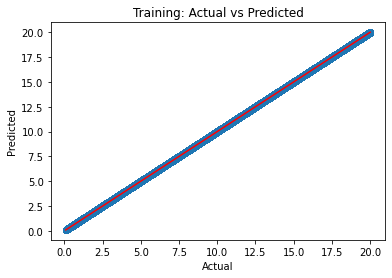

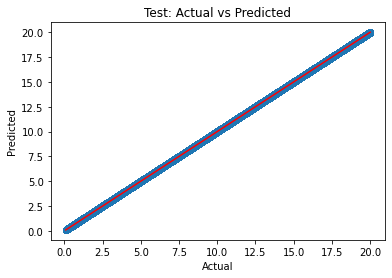

In [0]:
import matplotlib.pyplot as plt

# Plot actual vs predicted values for training data
plt.scatter(y_train, model.predict(X_train))
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], color='red')
plt.title("Training: Actual vs Predicted")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.show()

# Plot actual vs predicted values for test data
plt.scatter(y_test, model.predict(X_test))
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red')
plt.title("Test: Actual vs Predicted")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.show()
